<a href="https://colab.research.google.com/github/Leriloe/Dataton/blob/main/CalidadDelAire.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Anexo 5.3**
# **Modelos del Índice de la Calidad del Aire en CDMX 2021**

## Proyecto de Datatón
## Equipo Dinamita 2.0

Leriloe Gutiérrez Soto

Eduardo Sánchez Baños

# **Preparación de Python.**

In [75]:
# Librerías
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings('ignore')
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_val_score
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report


In [2]:
!pip install dataprep

     |████████████████████████████████| 1.8 MB 5.4 MB/s 
     |████████████████████████████████| 50 kB 7.0 MB/s 
     |████████████████████████████████| 63 kB 2.8 MB/s 
     |████████████████████████████████| 848 kB 55.9 MB/s 
     |████████████████████████████████| 10.1 MB 58.5 MB/s 
     |████████████████████████████████| 1.3 MB 55.0 MB/s 
     |████████████████████████████████| 1.5 MB 60.1 MB/s 
     |████████████████████████████████| 719 kB 57.8 MB/s 
     |████████████████████████████████| 366 kB 46.0 MB/s 
     |████████████████████████████████| 160 kB 49.5 MB/s 
     |████████████████████████████████| 271 kB 47.0 MB/s 
     |████████████████████████████████| 125 kB 37.4 MB/s 
     |████████████████████████████████| 49 kB 6.1 MB/s 
     |████████████████████████████████| 1.5 MB 49.5 MB/s 
     |████████████████████████████████| 743 kB 60.4 MB/s 
  Created wheel for metaphone: filename=Metaphone-0.6-py3-none-any.whl size=13919 sha256=a044cff4f03cebe955117f1bb327d0fc64a7678e3015812

# **Lectura de base de datos.**

In [3]:
# Se importa el reporte descargado de la librería.
from dataprep.eda import create_report

NumExpr defaulting to 2 threads.


In [78]:
aire = pd.read_csv('indice_2021_1.csv',engine='python', error_bad_lines=False)
aire.head()

,Fecha,Hora,Noroeste ozono,Noroeste dioxido de azufre,Noroeste dioxido de nitrogeno,Noroeste monoxido de carbono,Noroeste PM10,Noroeste PM25,Noreste ozono,Noreste dioxido de azufre,Noreste dioxido de nitr�geno,Noreste monoxido de carbono,Noreste PM10,Noreste PM25,Centro ozono,Centro dioxido de azufre,Centro dioxido de nitrogeno,Centro monoxido de carbono,Centro PM10,Centro PM25,Suroeste ozono,Suroeste dioxido de azufre,Suroeste dioxido de nitrogeno,Suroeste monoxido de carbono,Suroeste PM10,Suroeste PM25,Sureste ozono,Sureste dioxido de azufre,Sureste dioxido de nitrogeno,Sureste monoxido de carbono,Sureste PM10,Sureste PM25,Riesgo,Contador
0,01/01/2021,1,18,4,14,6,90,34,14,4,17,9,109,63,5,4,17,6,68,40,14,2,16,5,63,43,18,2,9,4,80,39,MODERADO,2
1,01/01/2021,2,14,4,18,7,93,38,16,4,15,10,112,65,3,4,18,7,65,44,15,2,12,5,64,51,15,2,13,4,83,44,ALTO,3
2,01/01/2021,3,6,4,17,7,100,44,17,6,14,13,114,67,4,4,19,8,64,51,18,2,10,6,67,55,14,2,11,4,87,54,ALTO,3
3,01/01/2021,4,6,4,16,8,102,51,15,6,14,15,118,69,2,4,18,8,65,53,19,2,11,6,67,57,14,2,14,4,90,57,EXTREMADAMENTE ALTO,4
4,01/01/2021,5,4,4,15,9,102,54,15,6,15,16,123,70,4,4,17,9,67,56,17,2,12,7,65,58,13,2,12,4,91,69,EXTREMADAMENTE ALTO,4


# **Análisis Exploratorio de datos.**

DataPrep Report
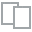
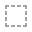
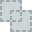
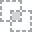
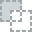
...
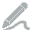
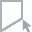
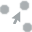
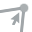
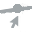

In [77]:
# Se crea el reporte.
create_report(aire)

Se realizó un análisis exploratorio de las variables del dataframe "Aire", y se observó que la mayoría de las concentraciones promedios de los contaminantes se comformaban de forma  Normal.

Además, el gráfico de calor existe una relación de correlación de las concentraciones promedio de los contaminantes entre regiones. 

In [26]:
# Se analiza el Riesgo respecto a la hora: 1 am -  12 pm = False, 13-24 pm = True.
aire.groupby([aire['Hora']>12] )['Riesgo'].value_counts()

Hora   Riesgo             
False  MODERADO               1110
        BAJO                  1040
       ALTO                   1013
       EXTREMADAMENTE ALTO       5
True   ALTO                   1398
       MODERADO               1177
        BAJO                   557
       EXTREMADAMENTE ALTO      27
Name: Riesgo, dtype: int64

La anterior tabla muestra el conteo del Riesgo respecto a la hora del día, y se corrobora que el Riesgo a la salud de la calidad del aire está relacionado con la movilidad diaria de la ciudad de acuerdo a la hora del día; siendo la mayor concentración de riesgo a partir de medio día. 

# **Modelos de aprendizaje supervisado**

Ahora,  para ejecutar los modelos de aprendizaje supervisado, la información debe estar en una matriz en la que cada columna sea una variable y cada fila una observación diferente, y la variable objetivo debe ser una sola columna con el mismo número de observaciones (Alducín, 2021). Por ello, se realizan las modificaciones adecuadas a la base de datos. 

In [79]:
# Se limpia la base de datos para ejecutar los modelos de aprendizaje supervisado.
aire1 = pd.read_csv('indice_2021_2.csv',engine='python', error_bad_lines=False)
aire1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6327 entries, 0 to 6326
Data columns (total 31 columns):
 #   Column                         Non-Null Count  Dtype
---  ------                         --------------  -----
 0   Noroeste ozono                 6327 non-null   int64
 1   Noroeste dioxido de azufre     6327 non-null   int64
 2   Noroeste dioxido de nitrogeno  6327 non-null   int64
 3   Noroeste monoxido de carbono   6327 non-null   int64
 4   Noroeste PM10                  6327 non-null   int64
 5   Noroeste PM25                  6327 non-null   int64
 6   Noreste ozono                  6327 non-null   int64
 7   Noreste dioxido de azufre      6327 non-null   int64
 8   Noreste dioxido de nitr�geno   6327 non-null   int64
 9   Noreste monoxido de carbono    6327 non-null   int64
 10  Noreste PM10                   6327 non-null   int64
 11  Noreste PM25                   6327 non-null   int64
 12  Centro ozono                   6327 non-null   int64
 13  Centro dioxido de 

De esta forma, nuestra variable objetivo es "Contador" (vairable dependiente), y las variables independientes son todas las concentraciones promedio por región de los contaminantes.

**Modelos de clasificación**

El **Modelo K-NN** clasifica cada dato nuevo en el grupo que corresponda, según tenga k vecinos más cerca de un grupo o de otro: calcula la distancia del elemento nuevo a cada uno de los existentes, y ordena dichas distancias de menor a mayor para ir seleccionando el grupo al que pertenecer (MERKLE INC., s.f.).

"La **Regresión Logística** resulta útil para los casos en los que se desea predecir la presencia o ausencia de una característica o resultado según los valores de un conjunto de predictores. Es similar a un modelo de regresión lineal pero está adaptado para modelos en los que la variable dependiente es dicotómica. Los coeficientes de regresión logística pueden utilizarse para estimar la razón de probabilidad de cada variable independiente del modelo. La regresión logística se puede aplicar a un rango más amplio de situaciones de investigación que el análisis discriminante." (IBN, s.f.)

**Métricas de precisión de los modelos**

El método **K-Fold Cross-Validation** (Alducín, 2021), validación cruzada, es un proceso iterativo que consiste en: dividir los datos de forma aleatoria en k grupos de aproximadamente el mismo tamaño, k-1 grupos se emplean para entrenar el modelo y uno de los grupos se emplea como validación (prueba). Este proceso se repite k veces utilizando un grupo distinto como validación en cada iteración, para generar k estimaciones del error cuyo promedio se emplea como estimación final.

La **matriz de confusión** es una herramienta que permite visualizar el desempeño del algoritmo (Alducín, 2021): cada columna de la matriz representa el número de predicciones de cada clase, y cada fila representa a las instancias en la clase real (los aciertos y errores en las predicciones del modelo).

La **Exactitud** (Accuracy) se refiere a lo cerca que está el resultado de una medición del valor verdadero (Alducín, 2021). 

La **Precisión** (Precision) se refiere a la dispersión del conjunto de valores obtenidos a partir de mediciones repetidas de una magnitud (Alducín, 2021). 

La **Sensibilidad** (Recall o Sensitivity) es la proporción de casos positivos que fueron correctamente identificadas por el algoritmo (Alducín, 2021).

La **Especificidad** (f1-score) son los casos negativos que el algoritmo ha clasificado correctamente (Alducín, 2021).

## **Modelo K-NN**

Primero se calculará un modelo K-NN estandar, con 7 vecinos y una división de datos del 30/70 (con el 30% se entrena y con el 70% se prueba el modelo). La literatura indica que esa división de los datos es adecuada (Alducín, 2021), pero más adelante se hará una Validación Cruzada para determinarlo.

In [37]:
# Se definen las variables.
X = aire1.drop('Contador',axis=1)
y = aire1['Contador']

# Divición de datos en 30/70.
X_train, X_test, y_train, y_test = train_test_split(X,y,test_size=0.4, random_state=100, stratify=y)

# Creación de un clasificador K-NN con 7 vecinos 
knn = KNeighborsClassifier(n_neighbors=7)

# Ajuste del clasificador a los datos de entrenamiento.
knn.fit(X_train,y_train)

# Precisión modelo sobre los conjuntos de datos de entrenamiento y prueba, redondeado a 2 decimales.
a = knn.score(X_train, y_train)
b = knn.score(X_test, y_test)

print('La precisión del algoritmo K-NN en el conjunto de entrenamiento es de: {:.2f}'
    .format(a))
print('La precisión del algoritmo K-NN en el conjunto de prueba es de: {:.2f}'
    .format(b))

La precisión del algoritmo K-NN en el conjunto de entrenamiento es de: 0.81
La precisión del algoritmo K-NN en el conjunto de prueba es de: 0.74


Una vez que se tiene el modelo K-NN estandar, se va a determinar la cantidad de vecinos k más adecuada para este modelo.

Así, se generan 9 vecinos (del 1-9) y se prueba el modelo con cada uno de ellos.

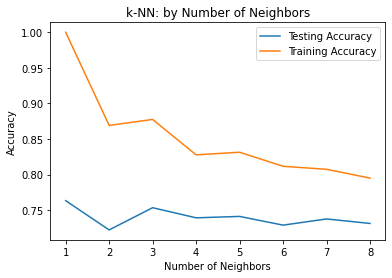

In [32]:
# Coniguración de arreglos iniciales (números vacíos)
neighbors = np.arange(1, 9)
train_accuracy = np.empty(len(neighbors))
test_accuracy = np.empty(len(neighbors))

# Loop para diferentes valores de k
for i, k in enumerate(neighbors):
    # Clasificador k-NN para el parametro k
    knn = KNeighborsClassifier(n_neighbors=k)

    # Ajuste del clasificador a los datos de entrenamiento
    knn.fit(X_train,y_train)
    
    # Cálculo de precisión sobre los datos de entrenamiento
    train_accuracy[i] = knn.score(X_train, y_train)

    # Cálculo de precision sobre el dataset de prueba
    test_accuracy[i] = knn.score(X_test, y_test)

# Gráfico para encontrar un valor optimo de k
plt.plot(neighbors, test_accuracy, label = 'Testing Accuracy')
plt.plot(neighbors, train_accuracy, label = 'Training Accuracy')
plt.title('k-NN: by Number of Neighbors')
plt.xlabel('Number of Neighbors')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

El gráfico muestra que a partir de k = 4, la precisión del modelo tiende a ser constante, tanto para el modelo de prueba como el de entrenamiento, con un rango cercano entre 0.75-0.85. Por lo que se determina que esa cantidad de vecinos es adecuada para el modelo K-NN.

De esta forma, se considera k=4 y se vuelve a correr el modelo anterior.

In [39]:

# Divición de datos en 30/70.
X_train, X_test, y_train, y_test = train_test_split(X,y,test_size=0.4, random_state=100, stratify=y)

# Creación de un clasificador K-NN con 4 vecinos 
knn = KNeighborsClassifier(n_neighbors=4)

# Ajuste del clasificador a los datos de entrenamiento.
knn.fit(X_train,y_train)

# Precisión modelo sobre los conjuntos de datos de entrenamiento y prueba, redondeado a 2 decimales.
a = knn.score(X_train, y_train)
b = knn.score(X_test, y_test)

print('La precisión del algoritmo K-NN en el conjunto de entrenamiento es de: {:.2f}'
    .format(a))
print('La precisión del algoritmo K-NN en el conjunto de prueba es de: {:.2f}'
    .format(b))

La precisión del algoritmo K-NN en el conjunto de entrenamiento es de: 0.83
La precisión del algoritmo K-NN en el conjunto de prueba es de: 0.74


Notamos que las precisiones se mantuvieron, por lo que la elección de una k más pequeña no afectó de forma negativa al modelo.

Ahora, se va a llevar a cabo una validación cruzada de 5 niveles (Alducín, 2021), para determinar si la partición de la base de datos de 30/70 es adecuada, usando la partición de entrenamiento. 

In [40]:
# Se crean las validaciones cruzadas con la porción de entrenamiento

cv_scores = cross_val_score(knn,X_train,y_train,cv=5)

# Imprime los resultados de la validación cruzada
print(cv_scores)
# Imprime el promedio de las validaciones cruzadas
print("Average 5-Fold CV Score: {}".format(cv_scores.mean()))

[0.72105263 0.7312253  0.71936759 0.73254282 0.74571805]
Average 5-Fold CV Score: 0.7299812773039317


Se puede observar que la precisión del modelo varió en un máxido de 3 centesimos de decimales considerando las 5 validaciones cruzadas (0.71-0.74); además, la precisión del modelo (0.74), comparándolo con el promedio de las validaciones, varió en 2 centesimos de decimales (0.72). 

Así, se determina que la partición 30/70 es buena.

Finalmente, se tiene el modelo K-NN con 4 vecinos con una precisión de 0.74.

## **Modelo de Regresión Logística**

Se repite el procedimiento que en el Modelo K-NN. No obstante, la métrica de precisión del modelo es a través de la matriz de confusión.

In [85]:
# Se vuelven a definir las variable independientes y la variable objetivo
X = aire1.drop('Contador',axis=1)
y = aire1['Contador']

# Creación de los conjuntos de entrenamiento y prueba en una proporción 70/30
X_train, X_test, y_train, y_test = train_test_split(X,y,test_size=0.3, random_state=100, stratify=y)

# Creación de un clasificador logístico
logreg = LogisticRegression()

# Ajuste del clasificador a los datos de entrenamiento
logreg.fit(X_train, y_train)

# Cálculo de las predicciones en los datos de prueba
y_pred = logreg.predict(X_test)

# Generación de la matriz de confusion y el reporte de clasificación
print(confusion_matrix(y_test, y_pred))
print(classification_report(y_test, y_pred))

[[332 129  18   0]
 [125 380 181   0]
 [ 22 149 553   0]
 [  0   1   9   0]]
              precision    recall  f1-score   support

           1       0.69      0.69      0.69       479
           2       0.58      0.55      0.57       686
           3       0.73      0.76      0.74       724
           4       0.00      0.00      0.00        10

    accuracy                           0.67      1899
   macro avg       0.50      0.50      0.50      1899
weighted avg       0.66      0.67      0.66      1899



En este caso, la precisión y demás métricas están dadas por la clase del Riesgo ("Contador").

Se realiza la validación cruzada con 5 validaciones, con la proporción de prueba de los datos.

In [83]:
# Se crean las validaciones cruzadas con la porción de entrenamiento

cv_scores = cross_val_score(logreg,X_train,y_train,cv=5)

# Imprime los resultados de la validación cruzada
print(cv_scores)
# Imprime el promedio de las validaciones cruzadas
print("Average 5-Fold CV Score: {}".format(cv_scores.mean()))

[0.64672686 0.65349887 0.63544018 0.67683616 0.65084746]
Average 5-Fold CV Score: 0.6526699060080856


Se puede observar que la precisión del modelo varió en un máxido de 3 centesimos de decimales considerando las 5 validaciones cruzadas (0.63-0.67); además, la precisión del modelo (0.67), comparándolo con el promedio de las validaciones, varió en 2 centesimos de decimales (0.65). 

Así, se determina que la partición 30/70 es buena.

A continuación, se muestran las predicciones realizadas por el modelo, y los valores verdaderos de la base de datos. 

In [86]:
print(y_pred)
print(y)

[1 2 3 ... 1 3 1]
0       2
1       3
2       3
3       4
4       4
       ..
6322    3
6323    3
6324    3
6325    3
6326    3
Name: Contador, Length: 6327, dtype: int64


De esta forma, se tiene un Modelo de Regresión Logística, con precisión del 0.65.